<a href="https://colab.research.google.com/github/PurraSujay/Deep-Learning-projects/blob/main/Image_captioning_with_Visual_Attention.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**Image captioning with Visual Attention !**

Project done with the help of Tensorflow and DeepLearning !

In [ ]:
import tensorflow as tf
import matplotlib.pyplot as plt
import collections
import random
import numpy as np
import os
import time
import json
from PIL import Image

**The MS-COCO dataset**
You will use the MS-COCO http://cocodataset.org/#home dataset to train your model. The dataset contains over 82,000 images, each of which has at least 5 different caption annotations.

In [ ]:
# Download caption annotation files
annotation_folder = '/annotations/'
if not os.path.exists(os.path.abspath('.') + annotation_folder):
  annotation_zip = tf.keras.utils.get_file('captions.zip',
                                           cache_subdir=os.path.abspath('.'),
                                           origin='http://images.cocodataset.org/annotations/annotations_trainval2014.zip',
                                           extract=True)
  annotation_file = os.path.dirname(annotation_zip)+'/annotations/captions_train2014.json'
  os.remove(annotation_zip)

# Download image files
image_folder = '/train2014/'
if not os.path.exists(os.path.abspath('.') + image_folder):
  image_zip = tf.keras.utils.get_file('train2014.zip',
                                      cache_subdir=os.path.abspath('.'),
                                      origin='http://images.cocodataset.org/zips/train2014.zip',
                                      extract=True)
  PATH = os.path.dirname(image_zip) + image_folder
  os.remove(image_zip)
else:
  PATH = os.path.abspath('.') + image_folder

13510574080/13510573713 [==============================] - 326s 0us/step


In [ ]:
with open(annotation_file, 'r') as f:
  annotations = json.load(f)
  

In [ ]:
# Group all captions together having the same image ID.
image_path_to_caption = collections.defaultdict(list)
for val in annotations['annotations']:
  caption = f"<start> {val['caption']} <end>"
  image_path = PATH + 'COCO_train2014_' + '%012d.jpg' % (val['image_id'])
  image_path_to_caption[image_path].append(caption)
#image_path_to_caption has key and values, where key is the path for image and values is the list of 5 descriptions

In [ ]:
image_path_to_caption.keys()

dict_keys(['/content/train2014/COCO_train2014_000000318556.jpg', '/content/train2014/COCO_train2014_000000116100.jpg', '/content/train2014/COCO_train2014_000000379340.jpg', '/content/train2014/COCO_train2014_000000134754.jpg', '/content/train2014/COCO_train2014_000000538480.jpg', '/content/train2014/COCO_train2014_000000476220.jpg', '/content/train2014/COCO_train2014_000000299675.jpg', '/content/train2014/COCO_train2014_000000032275.jpg', '/content/train2014/COCO_train2014_000000302443.jpg', '/content/train2014/COCO_train2014_000000025470.jpg', '/content/train2014/COCO_train2014_000000513461.jpg', '/content/train2014/COCO_train2014_000000018691.jpg', '/content/train2014/COCO_train2014_000000285579.jpg', '/content/train2014/COCO_train2014_000000266366.jpg', '/content/train2014/COCO_train2014_000000226658.jpg', '/content/train2014/COCO_train2014_000000124567.jpg', '/content/train2014/COCO_train2014_000000293605.jpg', '/content/train2014/COCO_train2014_000000321194.jpg', '/content/train20

In [ ]:
annotations['annotations'][1]

{'caption': 'A panoramic view of a kitchen and all of its appliances.',
 'id': 67,
 'image_id': 116100}

In [ ]:
image_paths = list(image_path_to_caption.keys())
random.shuffle(image_paths)

# Select the first 10000 image_paths from the shuffled set.
# Approximately each image id has 5 captions associated with it, so that will
# lead to 50,000 examples.
train_image_paths = image_paths[:10000]
print(len(train_image_paths))

10000


In [ ]:
train_captions = []
img_name_vector = []

for image_path in train_image_paths:
  caption_list = image_path_to_caption[image_path]
  train_captions.extend(caption_list)
  img_name_vector.extend([image_path] * len(caption_list))

In [ ]:
img_name_vector[0:10]

['/content/train2014/COCO_train2014_000000355159.jpg',
 '/content/train2014/COCO_train2014_000000355159.jpg',
 '/content/train2014/COCO_train2014_000000355159.jpg',
 '/content/train2014/COCO_train2014_000000355159.jpg',
 '/content/train2014/COCO_train2014_000000355159.jpg',
 '/content/train2014/COCO_train2014_000000260111.jpg',
 '/content/train2014/COCO_train2014_000000260111.jpg',
 '/content/train2014/COCO_train2014_000000260111.jpg',
 '/content/train2014/COCO_train2014_000000260111.jpg',
 '/content/train2014/COCO_train2014_000000260111.jpg']

In [ ]:
train_captions[0:10]

['<start> Two young girls about to eat pizza off paper plates. <end>',
 '<start> Two children sit in front of plates of pizza. <end>',
 '<start> Two young girls eating slices of slightly burnt pizza. <end>',
 '<start> Two little girls sitting at a table with a plate of pizza. <end>',
 '<start> Two children eating slices of pizza in a restaurant  <end>',
 '<start> Small computer monitor sitting in front of a bed and window in a bedroom. <end>',
 '<start> The bedroom contains a bare mattress and a desktop computer. <end>',
 '<start> A bedroom with green curtains and small tv <end>',
 '<start> A small white TV sitting on top of a wooden dresser next to a bed. <end>',
 '<start> A TV and a bed in a room. <end>']

<start> Two young girls about to eat pizza off paper plates. <end>
<start> Two children sit in front of plates of pizza. <end>
<start> Two young girls eating slices of slightly burnt pizza. <end>
<start> Two little girls sitting at a table with a plate of pizza. <end>
<start> Two children eating slices of pizza in a restaurant  <end>


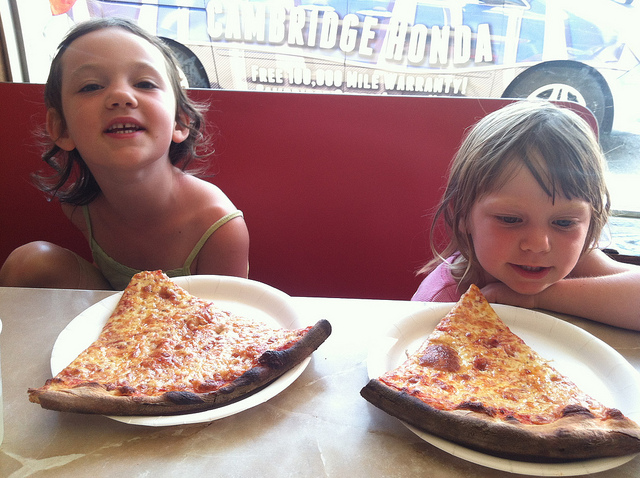

In [ ]:
for i in range(5):
  print(train_captions[i])
Image.open(img_name_vector[0])

<start> Small computer monitor sitting in front of a bed and window in a bedroom. <end>
<start> The bedroom contains a bare mattress and a desktop computer. <end>
<start> A bedroom with green curtains and small tv <end>
<start> A small white TV sitting on top of a wooden dresser next to a bed. <end>
<start> A TV and a bed in a room. <end>


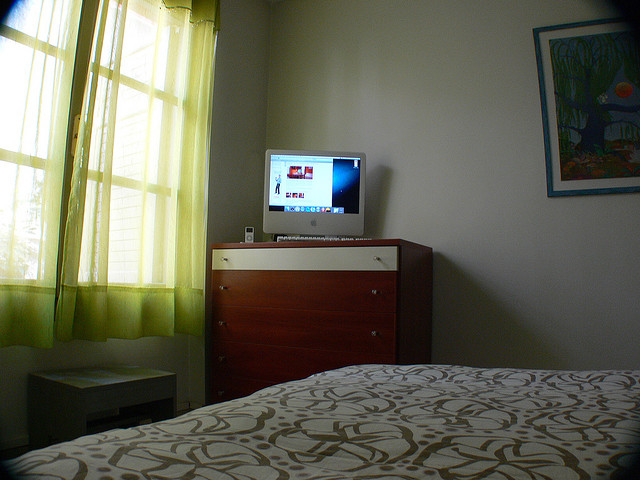

In [ ]:
for i in range(5,10):
  print(train_captions[i])
Image.open(img_name_vector[5])

**Preprocess the images using InceptionV3**
Next, you will use InceptionV3 (which is pretrained on Imagenet) to classify each image. You will extract features from the last convolutional layer.

First, you will convert the images into InceptionV3's expected format by:

Resizing the image to 299px by 299px
Preprocess the images using the preprocess_input method to normalize the image so that it contains pixels in the range of -1 to 1, which matches the format of the images used to train InceptionV3.

In [ ]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (299, 299))
    img = tf.keras.applications.inception_v3.preprocess_input(img)
    return img, image_path

**initialize InceptionV3 and load the pretrained Imagenet weights**

In [ ]:
image_model = tf.keras.applications.InceptionV3(include_top=False,
                                                weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output

image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

**Caching the features extracted from InceptionV3**

In [ ]:
# Get unique images
from tqdm import tqdm


encode_train = sorted(set(img_name_vector))

image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.AUTOTUNE).batch(16)

for img, path in tqdm(image_dataset):
  batch_features = image_features_extract_model(img)
  batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    np.save(path_of_feature, bf.numpy())

**Preprocess and tokenize the captions**

First, you'll tokenize the captions (for example, by splitting on spaces). This gives us a vocabulary of all of the unique words in the data (for example, "surfing", "football", and so on).
Next, you'll limit the vocabulary size to the top 5,000 words (to save memory)

In [ ]:
# Find the maximum length of any caption in our dataset
def calc_max_length(tensor):
    return max(len(t) for t in tensor)

In [ ]:
# Choose the top 5000 words from the vocabulary
top_k = 5000
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                  oov_token="<unk>",
                                                  filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
tokenizer.fit_on_texts(train_captions)

In [ ]:
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

In [ ]:
# Create the tokenized vectors
train_seqs = tokenizer.texts_to_sequences(train_captions)

In [ ]:
# Pad each vector to the max_length of the captions
# If you do not provide a max_length value, pad_sequences calculates it automatically
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

In [ ]:
# Calculates the max_length, which is used to store the attention weights
max_length = calc_max_length(train_seqs)

Split the data into training and testing

In [ ]:
img_to_cap_vector = collections.defaultdict(list)
for img, cap in zip(img_name_vector, cap_vector):
  img_to_cap_vector[img].append(cap)

# Create training and validation sets using an 80-20 split randomly.
img_keys = list(img_to_cap_vector.keys())
random.shuffle(img_keys)

slice_index = int(len(img_keys)*0.8)
img_name_train_keys, img_name_val_keys = img_keys[:slice_index], img_keys[slice_index:]

img_name_train = []
cap_train = []
for imgt in img_name_train_keys:
  capt_len = len(img_to_cap_vector[imgt])
  img_name_train.extend([imgt] * capt_len)
  cap_train.extend(img_to_cap_vector[imgt])

img_name_val = []
cap_val = []
for imgv in img_name_val_keys:
  capv_len = len(img_to_cap_vector[imgv])
  img_name_val.extend([imgv] * capv_len)
  cap_val.extend(img_to_cap_vector[imgv])

In [ ]:
len(set(img_name_train)), len(cap_train), len(set(img_name_val)), len(cap_val)


(8000, 40023, 2000, 10008)

**Create a tf.data dataset for training**

Your images and captions are ready! Next, let's create a tf.data dataset to use for training your model.

In [ ]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000
embedding_dim = 256
units = 512
vocab_size = top_k + 1
num_steps = len(img_name_train) // BATCH_SIZE
# Shape of the vector extracted from InceptionV3 is (64, 2048)
# These two variables represent that vector shape
features_shape = 2048
attention_features_shape = 64

In [ ]:
# Load the numpy files
def map_func(img_name, cap):
  img_tensor = np.load(img_name.decode('utf-8')+'.npy')
  return img_tensor, cap

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.AUTOTUNE)

**Model**
the decoder below is identical to the one in the example for Neural Machine Translation with Attention.

The model architecture is inspired by the Show, Attend and Tell paper.

In this example, extract the features from the lower convolutional layer of InceptionV3 giving us a vector of shape (8, 8, 2048).
You squash that to a shape of (64, 2048).
This vector is then passed through the CNN Encoder (which consists of a single Fully connected layer).
The RNN (here GRU) attends over the image to predict the next word.

In [ ]:
class Attention(tf.keras.Model):
  def __init__(self, units):
    super(Attention, self).__init__()
    self.W1 = tf.keras.layers.Dense(units)
    self.W2 = tf.keras.layers.Dense(units)
    self.V = tf.keras.layers.Dense(1)

  def call(self, features, hidden):
    # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)

    # hidden shape == (batch_size, hidden_size)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
    hidden_with_time_axis = tf.expand_dims(hidden, 1)

    # attention_hidden_layer shape == (batch_size, 64, units)
    attention_hidden_layer = (tf.nn.tanh(self.W1(features) +
                                         self.W2(hidden_with_time_axis)))

    # score shape == (batch_size, 64, 1)
    # This gives you an unnormalized score for each image feature.
    score = self.V(attention_hidden_layer)

    # attention_weights shape == (batch_size, 64, 1)
    attention_weights = tf.nn.softmax(score, axis=1)

    # context_vector shape after sum == (batch_size, hidden_size)
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)

    return context_vector, attention_weights

In [ ]:
class CNN_Encoder(tf.keras.Model):
    # Since you have already extracted the features and dumped it
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 64, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)

    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [ ]:
class RNN_Decoder(tf.keras.Model):
  def __init__(self, embedding_dim, units, vocab_size):
    super(RNN_Decoder, self).__init__()
    self.units = units

    self.embedding = tf.keras.layers.Embedding(vocab_size, embedding_dim)
    self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    self.fc1 = tf.keras.layers.Dense(self.units)
    self.fc2 = tf.keras.layers.Dense(vocab_size)

    self.attention = Attention(self.units)

  def call(self, x, features, hidden):
    # defining attention as a separate model
    context_vector, attention_weights = self.attention(features, hidden)

    # x shape after passing through embedding == (batch_size, 1, embedding_dim)
    x = self.embedding(x)

    # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)

    # passing the concatenated vector to the GRU
    output, state = self.gru(x)

    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)

    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))

    # output shape == (batch_size * max_length, vocab)
    x = self.fc2(x)

    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

In [ ]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_dim, units, vocab_size)

In [ ]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')


def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

In [ ]:
checkpoint_path = "./checkpoints/train"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer=optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [ ]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
  # restoring the latest checkpoint in checkpoint_path
  ckpt.restore(ckpt_manager.latest_checkpoint)

**Training**

extract the features stored in the respective .npy files and then pass those features through the encoder.
The encoder output, hidden state(initialized to 0) and the decoder input (which is the start token) is passed to the decoder.
The decoder returns the predictions and the decoder hidden state.
The decoder hidden state is then passed back into the model and the predictions are used to calculate the loss.
Use teacher forcing to decide the next input to the decoder.
Teacher forcing is the technique where the target word is passed as the next input to the decoder.
The final step is to calculate the gradients and apply it to the optimizer and backpropagate.

In [ ]:
# adding this in a separate cell because if you run the training cell
# many times, the loss_plot array will be reset
loss_plot = []

In [ ]:
@tf.function
def train_step(img_tensor, target):
  loss = 0

  # initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])

  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)

  with tf.GradientTape() as tape:
      features = encoder(img_tensor)

      for i in range(1, target.shape[1]):
          # passing the features through the decoder
          predictions, hidden, _ = decoder(dec_input, features, hidden)

          loss += loss_function(target[:, i], predictions)

          # using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)

  total_loss = (loss / int(target.shape[1]))

  trainable_variables = encoder.trainable_variables + decoder.trainable_variables

  gradients = tape.gradient(loss, trainable_variables)

  optimizer.apply_gradients(zip(gradients, trainable_variables))

  return loss, total_loss

In [ ]:
EPOCHS = 20

for epoch in range(start_epoch, EPOCHS):
    start = time.time()
    total_loss = 0

    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss

        if batch % 100 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # storing the epoch end loss value to plot later
    loss_plot.append(total_loss / num_steps)

    if epoch % 5 == 0:
      ckpt_manager.save()

    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

Epoch 1 Batch 0 Loss 2.1431
Epoch 1 Batch 100 Loss 1.2186
Epoch 1 Batch 200 Loss 1.0614
Epoch 1 Batch 300 Loss 0.9544
Epoch 1 Batch 400 Loss 0.8085
Epoch 1 Batch 500 Loss 0.8438
Epoch 1 Batch 600 Loss 0.7890
Epoch 1 Loss 0.998391
Time taken for 1 epoch 195.51 sec

Epoch 2 Batch 0 Loss 0.8839
Epoch 2 Batch 100 Loss 0.8442
Epoch 2 Batch 200 Loss 0.7639
Epoch 2 Batch 300 Loss 0.7083
Epoch 2 Batch 400 Loss 0.7671
Epoch 2 Batch 500 Loss 0.7233
Epoch 2 Batch 600 Loss 0.7132
Epoch 2 Loss 0.780908
Time taken for 1 epoch 122.13 sec

Epoch 3 Batch 0 Loss 0.7561
Epoch 3 Batch 100 Loss 0.7318
Epoch 3 Batch 200 Loss 0.6840
Epoch 3 Batch 300 Loss 0.6772
Epoch 3 Batch 400 Loss 0.6240
Epoch 3 Batch 500 Loss 0.6666
Epoch 3 Batch 600 Loss 0.6937
Epoch 3 Loss 0.714806
Time taken for 1 epoch 145.71 sec

Epoch 4 Batch 0 Loss 0.7077
Epoch 4 Batch 100 Loss 0.7032
Epoch 4 Batch 200 Loss 0.6936
Epoch 4 Batch 300 Loss 0.6476
Epoch 4 Batch 400 Loss 0.6511
Epoch 4 Batch 500 Loss 0.6897
Epoch 4 Batch 600 Loss 0.62

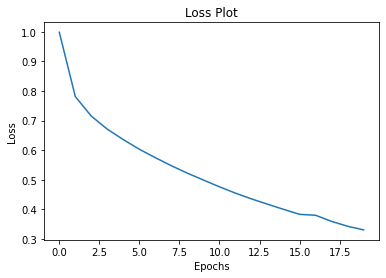

In [ ]:
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()


In [ ]:
def evaluate(image):
    attention_plot = np.zeros((max_length, attention_features_shape))

    hidden = decoder.reset_state(batch_size=1)

    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0],
                                                 -1,
                                                 img_tensor_val.shape[3]))

    features = encoder(img_tensor_val)

    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []

    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input,
                                                         features,
                                                         hidden)

        attention_plot[i] = tf.reshape(attention_weights, (-1, )).numpy()

        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])

        if tokenizer.index_word[predicted_id] == '<end>':
            return result, attention_plot

        dec_input = tf.expand_dims([predicted_id], 0)

    attention_plot = attention_plot[:len(result), :]
    return result, attention_plot

In [ ]:
def plot_attention(image, result, attention_plot):
    temp_image = np.array(Image.open(image))

    fig = plt.figure(figsize=(10, 10))

    len_result = len(result)
    for i in range(len_result):
        temp_att = np.resize(attention_plot[i], (8, 8))
        grid_size = max(np.ceil(len_result/2), 2)
        ax = fig.add_subplot(grid_size, grid_size, i+1)
        ax.set_title(result[i])
        img = ax.imshow(temp_image)
        ax.imshow(temp_att, cmap='gray', alpha=0.6, extent=img.get_extent())

    plt.tight_layout()
    plt.show()

Real Caption: <start> two giraffes and a zebra eating with each other <end>
Prediction Caption: a group of zebras eating giraffes in a forest <end>


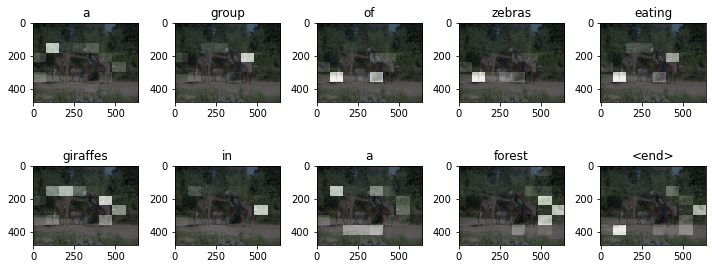

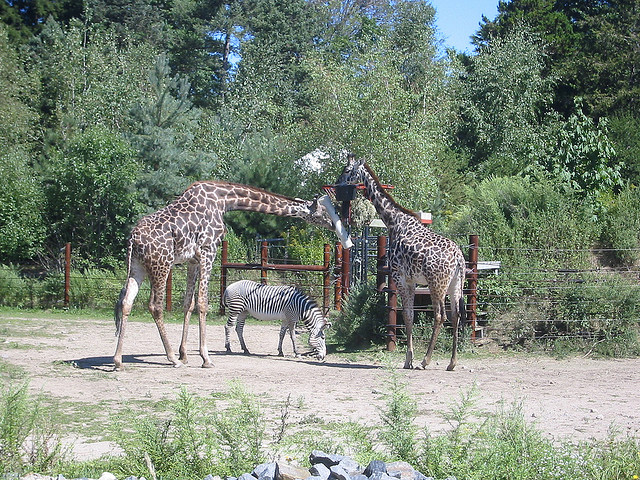

In [ ]:
# captions on the validation set
rid = np.random.randint(0, len(set(img_name_val)))
image = img_name_val[rid]
real_caption = ' '.join([tokenizer.index_word[i]
                        for i in cap_val[rid] if i not in [0]])
result, attention_plot = evaluate(image)

print('Real Caption:', real_caption)
print('Prediction Caption:', ' '.join(result))
plot_attention(image, result, attention_plot)
Image.open(image)


**predict it on your own images**

Predicted Caption: a surfer about to play on a beach holding a surf board on a beach <end>


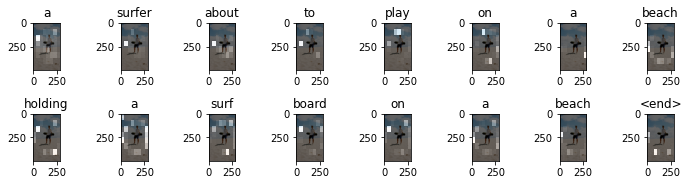

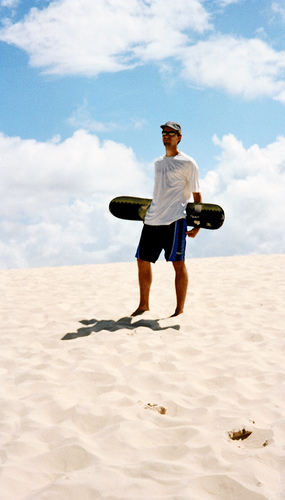

In [ ]:
image_url = '/content/112178718_87270d9b4d.jpg'

result, attention_plot = evaluate(image_url)
print('Predicted Caption:', ' '.join(result))
plot_attention(image_url, result, attention_plot)
# opening the image
Image.open(image_url)

Prediction Caption: several pieces of pasta and vegetables


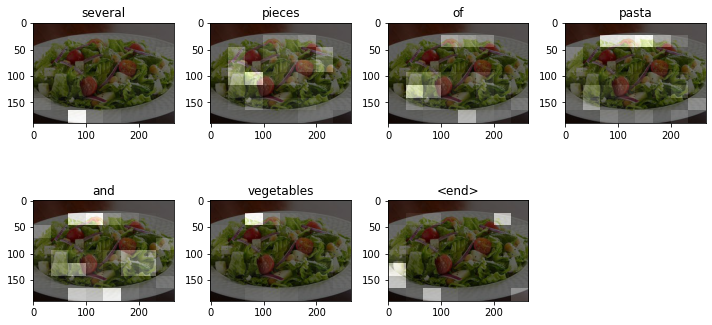

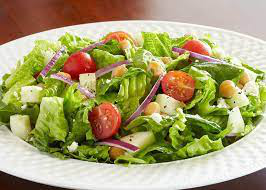

In [ ]:
image_url = '/content/saalad.jpg'

result, attention_plot = evaluate(image_url)
print('Prediction Caption:', ' '.join(result[:-1]))
plot_attention(image_url, result, attention_plot)
# opening the image
Image.open(image_url)

Prediction Caption: white plate has a fork and chocolate spread on it


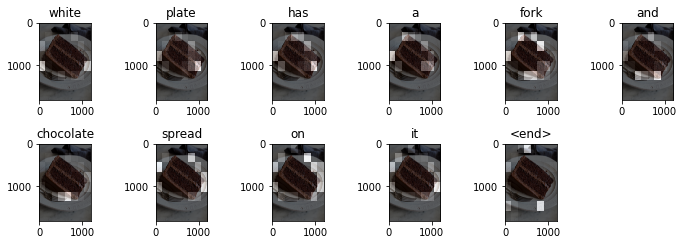

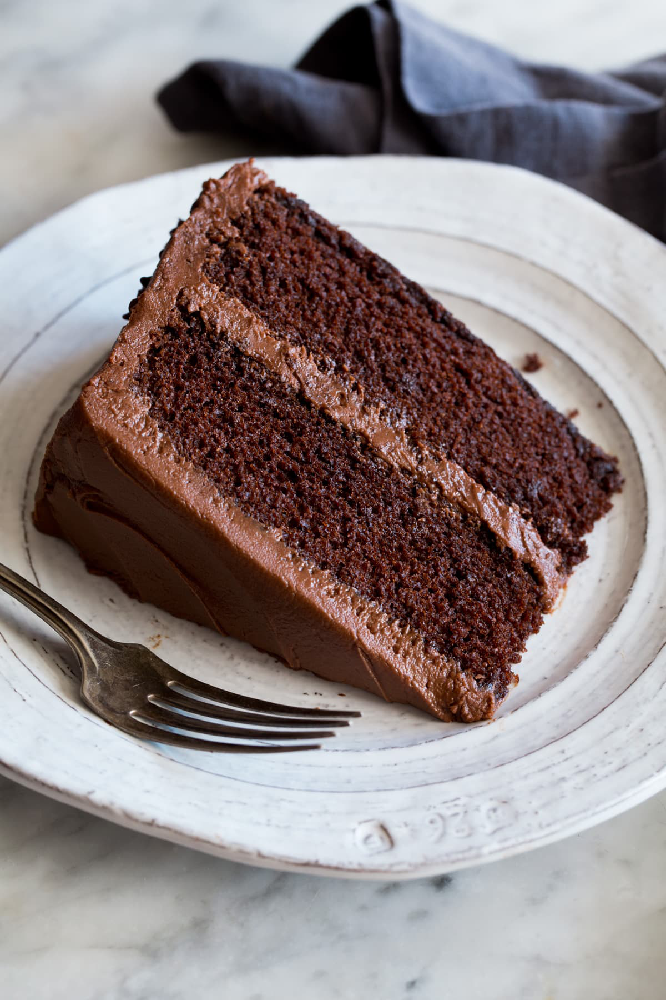

In [ ]:
image_url = '/content/cake.jpg'

result, attention_plot = evaluate(image_url)
print('Prediction Caption:', ' '.join(result[:-1]))
plot_attention(image_url, result, attention_plot)
# opening the image
Image.open(image_url)